<a href="https://colab.research.google.com/github/igoradriano/ManimML_test/blob/main/ManimML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Library Documentation: https://github.com/helblazer811/ManimML

In [1]:
!sudo apt update
!sudo apt install libcairo2-dev ffmpeg \
    texlive texlive-latex-extra texlive-fonts-extra \
    texlive-latex-recommended texlive-science \
    tipa libpango1.0-dev
!pip install manim
!pip install IPython --upgrade

Hit:1 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:2 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:3 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:4 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:5 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:7 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
24 packages can be upgraded. Run 'apt list --upgradable' to see them.
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
l

In [4]:
from manim import *

In [3]:
%%manim -qm -v WARNING SquareToCircle

class SquareToCircle(Scene):
   def construct(self):
      square = Square()
      circle = Circle()
      circle.set_fill(PINK, opacity=0.5)
      self.play(Create(square))
      self.play(Transform(square, circle))
      self.wait()

# First Neural Network


This is a visualization of a Convolutional Neural Network. The code needed to generate this visualization is shown below.

In [5]:
%%manim -qm -v WARNING BasicScene

from manim_ml.neural_network import Convolutional2DLayer, FeedForwardLayer, NeuralNetwork

# This changes the resolution of our rendered videos
config.pixel_height = 700
config.pixel_width = 1900
config.frame_height = 7.0
config.frame_width = 7.0

# Here we define our basic scene
class BasicScene(ThreeDScene):

    # The code for generating our scene goes here
    def construct(self):
        # Make the neural network
        nn = NeuralNetwork([
                Convolutional2DLayer(1, 7, 3, filter_spacing=0.32),
                Convolutional2DLayer(3, 5, 3, filter_spacing=0.32),
                Convolutional2DLayer(5, 3, 3, filter_spacing=0.18),
                FeedForwardLayer(3),
                FeedForwardLayer(3),
            ],
            layer_spacing=0.25,
        )
        # Center the neural network
        nn.move_to(ORIGIN)
        self.add(nn)
        # Make a forward pass animation
        forward_pass = nn.make_forward_pass_animation()
        # Play animation
        self.play(forward_pass)

Constructing layers
Current layer: Convolutional2DLayer
Current layer: Convolutional2DLayer
Current layer: Convolutional2DLayer
Current layer: FeedForwardLayer
Current layer: FeedForwardLayer
NeuralNetwork([
    Convolutional2DLayer(z_index=3, title_text= , ),
    Convolutional2DToConvolutional2D(input_layer=Convolutional2DLayer,output_layer=Convolutional2DLayer,)(z_index=2, title_text= , ),
    Convolutional2DLayer(z_index=3, title_text= , ),
    Convolutional2DToConvolutional2D(input_layer=Convolutional2DLayer,output_layer=Convolutional2DLayer,)(z_index=2, title_text= , ),
    Convolutional2DLayer(z_index=3, title_text= , ),
    Convolutional2DToFeedForward(input_layer=Convolutional2DLayer,output_layer=FeedForwardLayer,)(z_index=2, title_text= , ),
    FeedForwardLayer(z_index=3, title_text= , ),
    FeedForwardToFeedForward(input_layer=FeedForwardLayer,output_layer=FeedForwardLayer,)(z_index=2, title_text= , ),
    FeedForwardLayer(z_index=3, title_text= , ),
])
All filters at once:

# Setting Up a Scene

In Manim all of your visualizations and animations belong inside of a Scene. You can make a scene by extending the Scene class or the ThreeDScene class if your animation has 3D content (as does our example). Add the following code to a python module called example.py.

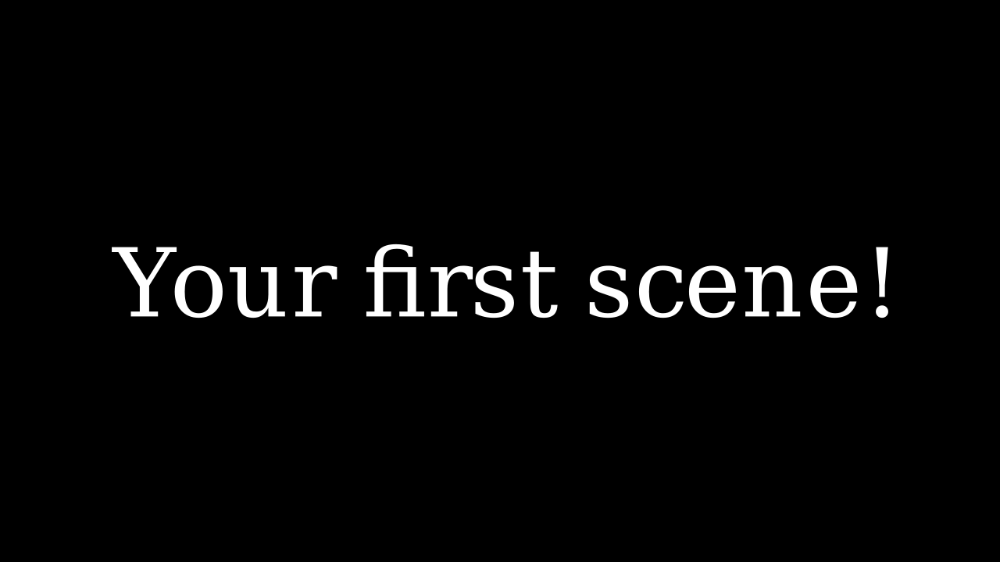

In [6]:
%%manim -qm -v WARNING BasicScene2

from manim import *
# Import modules here

class BasicScene2(ThreeDScene):

    def construct(self):
        # Your code goes here
        text = Text("Your first scene!")
        self.add(text)

# A Simple Feed Forward Network

Constructing layers
Current layer: FeedForwardLayer
Current layer: FeedForwardLayer
Current layer: FeedForwardLayer
NeuralNetwork([
    FeedForwardLayer(z_index=3, title_text= , ),
    FeedForwardToFeedForward(input_layer=FeedForwardLayer,output_layer=FeedForwardLayer,)(z_index=2, title_text= , ),
    FeedForwardLayer(z_index=3, title_text= , ),
    FeedForwardToFeedForward(input_layer=FeedForwardLayer,output_layer=FeedForwardLayer,)(z_index=2, title_text= , ),
    FeedForwardLayer(z_index=3, title_text= , ),
])


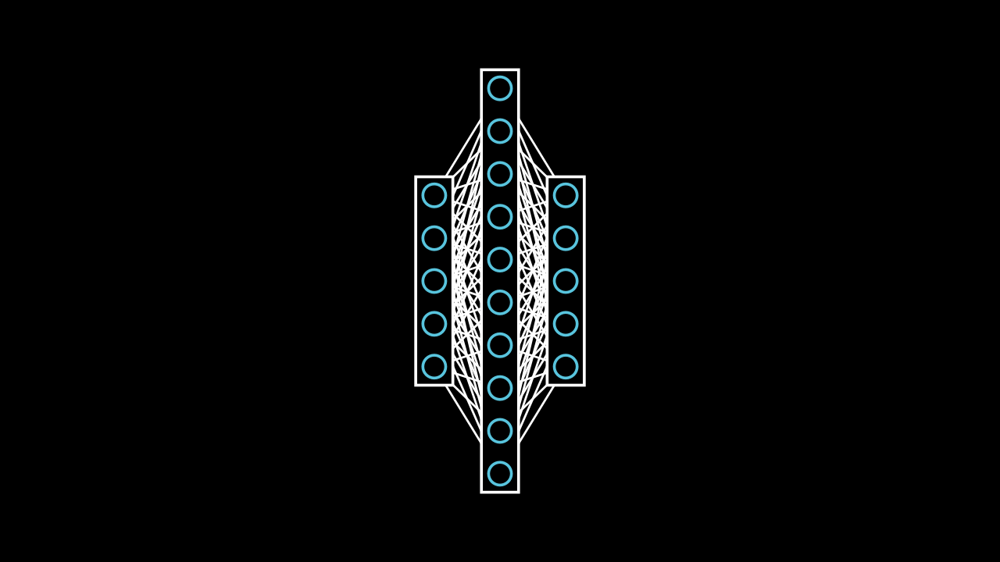

In [30]:
%%manim -qm -v WARNING BasicScene3

from manim_ml.neural_network import NeuralNetwork, FeedForwardLayer

class BasicScene3(ThreeDScene):
  def construct(self):
    nn = NeuralNetwork([
        FeedForwardLayer(num_nodes=5),
        FeedForwardLayer(num_nodes=10),
        FeedForwardLayer(num_nodes=5)
    ])
    self.add(nn)

In the above code we create a NeuralNetwork object and pass a list of layers to it. For each feed forward layer we specify the number of nodes. ManimML will automatically piece together the individual layers into a single neural network. We call self.add(nn) in the body of the scene's construct method in order to add the neural network to the scene.

The majority of ManimML neural network objects and functions can be imported directly from manim_ml.neural_network.

# Animating the Forward Pass


We can automatically render the forward pass of a neural network by creating the animation with the neural_network.make_forward_pass_animation method and play the animation in our scene with self.play(animation).

In [9]:
%%manim -qm -v WARNING BasicScene4

from manim_ml.neural_network import NeuralNetwork, FeedForwardLayer

class BasicScene4(ThreeDScene):
  def construct(self):
    # Make the neural network
    nn = NeuralNetwork([
        FeedForwardLayer(num_nodes=3),
        FeedForwardLayer(num_nodes=5),
        FeedForwardLayer(num_nodes=3)
    ])
    self.add(nn)
    # Make the animation
    forward_pass_animation = nn.make_forward_pass_animation()
    # Play the animation
    self.play(forward_pass_animation)

Constructing layers
Current layer: FeedForwardLayer
Current layer: FeedForwardLayer
Current layer: FeedForwardLayer
NeuralNetwork([
    FeedForwardLayer(z_index=3, title_text= , ),
    FeedForwardToFeedForward(input_layer=FeedForwardLayer,output_layer=FeedForwardLayer,)(z_index=2, title_text= , ),
    FeedForwardLayer(z_index=3, title_text= , ),
    FeedForwardToFeedForward(input_layer=FeedForwardLayer,output_layer=FeedForwardLayer,)(z_index=2, title_text= , ),
    FeedForwardLayer(z_index=3, title_text= , ),
])


# Convolutional Neural Networks

ManimML supports visualizations of Convolutional Neural Networks. You can specify the number of feature maps, feature map size, and filter size as follows Convolutional2DLayer(num_feature_maps, feature_map_size, filter_size). There are a number of other style parameters that we can change as well(documentation coming soon).

Here is a multi-layer convolutional neural network. If you are unfamiliar with convolutional networks this overview is a great resource. Additionally, CNN Explainer is a great interactive tool for understanding CNNs, all in the browser.

When specifying CNNs it is important for the feature map sizes and filter dimensions of adjacent layers match up.

In [14]:
%%manim -pql -v WARNING BasicScene5
from manim_ml.neural_network import NeuralNetwork, FeedForwardLayer, Convolutional2DLayer

class BasicScene5(ThreeDScene):
  def construct(self):
    nn = NeuralNetwork([
            Convolutional2DLayer(1, 7, 3, filter_spacing=0.32), # Note the default stride is 1.
            Convolutional2DLayer(3, 5, 3, filter_spacing=0.32),
            Convolutional2DLayer(5, 3, 3, filter_spacing=0.18),
            FeedForwardLayer(3),
            FeedForwardLayer(3),
        ],
        layer_spacing=0.25,
    )
    # Center the neural network
    nn.move_to(ORIGIN)
    self.add(nn)
    # Make a forward pass animation
    forward_pass = nn.make_forward_pass_animation()
    # Play animation
    self.play(forward_pass)

Constructing layers
Current layer: Convolutional2DLayer
Current layer: Convolutional2DLayer
Current layer: Convolutional2DLayer
Current layer: FeedForwardLayer
Current layer: FeedForwardLayer
NeuralNetwork([
    Convolutional2DLayer(z_index=3, title_text= , ),
    Convolutional2DToConvolutional2D(input_layer=Convolutional2DLayer,output_layer=Convolutional2DLayer,)(z_index=2, title_text= , ),
    Convolutional2DLayer(z_index=3, title_text= , ),
    Convolutional2DToConvolutional2D(input_layer=Convolutional2DLayer,output_layer=Convolutional2DLayer,)(z_index=2, title_text= , ),
    Convolutional2DLayer(z_index=3, title_text= , ),
    Convolutional2DToFeedForward(input_layer=Convolutional2DLayer,output_layer=FeedForwardLayer,)(z_index=2, title_text= , ),
    FeedForwardLayer(z_index=3, title_text= , ),
    FeedForwardToFeedForward(input_layer=FeedForwardLayer,output_layer=FeedForwardLayer,)(z_index=2, title_text= , ),
    FeedForwardLayer(z_index=3, title_text= , ),
])
All filters at once:

# Convolutional Neural Network with an Image

We can also animate an image being fed into a convolutional neural network by specifiying an ImageLayer before the first convolutional layer.

In [17]:
import tensorflow as tf
from tensorflow.keras.datasets import mnist
import cv2

# Escolha o dígito e o índice da imagem
digito = 7
indice = 300

# Carregue o dataset MNIST
(x_train, y_train), (x_test, y_test) = mnist.load_data()

# Obtenha a imagem como array NumPy
imagem = x_train[indice, :, :]

# Crie o nome do arquivo com dígito e índice
nome_arquivo = f"mnist_{digito}_{indice:03}.png"

# Salve a imagem como PNG
cv2.imwrite(nome_arquivo, imagem)


True

In [19]:
%%manim -pql -v WARNING BasicScene6

import numpy as np
from PIL import Image
from manim_ml.neural_network import NeuralNetwork, FeedForwardLayer, Convolutional2DLayer, ImageLayer

class BasicScene6(ThreeDScene):
  def construct(self):

    image = Image.open("mnist_7_300.png") # You will need to download an image of a digit.
    numpy_image = np.asarray(image)

    nn = NeuralNetwork([
            ImageLayer(numpy_image, height=1.5),
            Convolutional2DLayer(1, 7, 3, filter_spacing=0.32), # Note the default stride is 1.
            Convolutional2DLayer(3, 5, 3, filter_spacing=0.32),
            Convolutional2DLayer(5, 3, 3, filter_spacing=0.18),
            FeedForwardLayer(3),
            FeedForwardLayer(3),
        ],
        layer_spacing=0.25,
    )
    # Center the neural network
    nn.move_to(ORIGIN)
    self.add(nn)
    # Make a forward pass animation
    forward_pass = nn.make_forward_pass_animation()
    self.play(forward_pass)

Constructing layers
Current layer: ImageLayer
Current layer: Convolutional2DLayer
Current layer: Convolutional2DLayer
Current layer: Convolutional2DLayer
Current layer: FeedForwardLayer
Current layer: FeedForwardLayer
NeuralNetwork([
    ImageLayer(z_index=3, title_text= , ),
    ImageToConvolutional2DLayer(z_index=2, title_text= , ),
    Convolutional2DLayer(z_index=3, title_text= , ),
    Convolutional2DToConvolutional2D(input_layer=Convolutional2DLayer,output_layer=Convolutional2DLayer,)(z_index=2, title_text= , ),
    Convolutional2DLayer(z_index=3, title_text= , ),
    Convolutional2DToConvolutional2D(input_layer=Convolutional2DLayer,output_layer=Convolutional2DLayer,)(z_index=2, title_text= , ),
    Convolutional2DLayer(z_index=3, title_text= , ),
    Convolutional2DToFeedForward(input_layer=Convolutional2DLayer,output_layer=FeedForwardLayer,)(z_index=2, title_text= , ),
    FeedForwardLayer(z_index=3, title_text= , ),
    FeedForwardToFeedForward(input_layer=FeedForwardLayer,out

# Max Pooling

A common operation in deep learning is the 2D Max Pooling operation, which reduces the size of convolutional feature maps. We can visualize max pooling with the MaxPooling2DLayer.

In [24]:
%%manim -pql -v WARNING BasicScene7

from manim_ml.neural_network import NeuralNetwork, Convolutional2DLayer, MaxPooling2DLayer

class BasicScene7(ThreeDScene):
  def construct(self):
    # Make neural network
    nn = NeuralNetwork([
            Convolutional2DLayer(1, 8),
            Convolutional2DLayer(3, 6, 3),
            MaxPooling2DLayer(kernel_size=2),
            Convolutional2DLayer(5, 2, 2),
        ],
        layer_spacing=0.25,
    )
    # Center the nn
    nn.move_to(ORIGIN)
    self.add(nn)
    # Play animation
    forward_pass = nn.make_forward_pass_animation()
    self.wait(1)
    self.play(forward_pass)

Constructing layers
Current layer: Convolutional2DLayer
Current layer: Convolutional2DLayer
Current layer: MaxPooling2DLayer
Current layer: Convolutional2DLayer
NeuralNetwork([
    Convolutional2DLayer(z_index=3, title_text= , ),
    Convolutional2DToConvolutional2D(input_layer=Convolutional2DLayer,output_layer=Convolutional2DLayer,)(z_index=2, title_text= , ),
    Convolutional2DLayer(z_index=3, title_text= , ),
    Convolutional2DToMaxPooling2D(input_layer=Convolutional2DLayer,output_layer=MaxPooling2DLayer,)(z_index=2, title_text= , ),
    MaxPooling2DLayer(z_index=3, title_text= , ),
    MaxPooling2DToConvolutional2D(input_layer=MaxPooling2DLayer,output_layer=Convolutional2DLayer,)(z_index=2, title_text= , ),
    Convolutional2DLayer(z_index=3, title_text= , ),
])
All filters at once: False


AttributeError: module 'manim_ml' has no attribute 'three_d_config'

# Activation Functions

Activation functions apply non-linarities to the outputs of neural networks. They have different shapes, and it is useful to be able to visualize the functions. I added the ability to visualize activation functions over FeedForwardLayer and Convolutional2DLayer by passing an argument as follows:

In [25]:
%%manim -pqh -v WARNING BasicScene8

from manim_ml.neural_network import NeuralNetwork, Convolutional2DLayer, FeedForwardLayer

class BasicScene8(ThreeDScene):
  def construct(self):

    # Make nn
    nn = NeuralNetwork([
            Convolutional2DLayer(1, 7, filter_spacing=0.32),
            Convolutional2DLayer(3, 5, 3, filter_spacing=0.32, activation_function="ReLU"),
            FeedForwardLayer(3, activation_function="Sigmoid"),
        ],
        layer_spacing=0.25,
    )
    self.add(nn)
    # Play animation
    forward_pass = nn.make_forward_pass_animation()
    self.play(forward_pass)

Constructing layers
Current layer: Convolutional2DLayer
Current layer: Convolutional2DLayer


[01/05/24 23:40:51] WARNING  Font sans-serif not in ['Accanthis ADF Std', 'Accanthis ADF Std    ]8;id=19463;file:///usr/local/lib/python3.10/dist-packages/manim/mobject/text/text_mobject.py\text_mobject.py]8;;\:]8;id=119480;file:///usr/local/lib/python3.10/dist-packages/manim/mobject/text/text_mobject.py#440\440]8;;\
                             No2', 'Accanthis ADF Std No3', 'Arimo', 'Asana Math', 'Berenis ADF                    
                             Pro', 'Berenis ADF Pro Math', 'C059', 'Cabin', 'Caladea',                             
                             'Cantarell', 'Carlito', 'Charis SIL', 'Comfortaa', 'Cousine',                         
                             'D050000L', 'DejaVu Math TeX Gyre', 'DejaVu Sans', 'DejaVu Sans                       
                             Mono', 'DejaVu Serif', 'Droid Sans Fallback', 'EB Garamond', 'EB                      
                             Garamond 12 All SC', 'EB Garamond Initials', 'EB Garamond Initials                    
                             Fill1', 'EB Garamond Initials Fill2', 'EB Garamond SC',                               
                             'FontAwesome', 'FoulisGreek', 'FreeMono', 'FreeSans', 'FreeSerif',                    
                             'GFS Artemisia', 'GFS Baskerville', 'GFS Complutum', 'GFS Didot',                     
                             'GFS Neohellenic', 'GFS Olga', 'GFS Porson', 'GFS Solomos',                           
                             'Gentium', 'Gentium Basic', 'Gentium Book Basic', 'Gentium Book                       
                             Plus', 'Gentium Plus', 'Gentium Plus Compact', 'GentiumAlt',                          
                             'Gillius ADF', 'Gillius ADF No2', 'Go', 'Go Medium', 'Go Mono',                       
                             'Go Smallcaps', 'Humor Sans', 'Junicode', 'Latin Modern Math',                        
                             'Latin Modern Mono', 'Latin Modern Mono Caps', 'Latin Modern Mono                     
                             Light', 'Latin Modern Mono Light Cond', 'Latin Modern Mono Prop',                     
                             'Latin Modern Mono Prop Light', 'Latin Modern Mono Slanted',                          
                             'Latin Modern Roman', 'Latin Modern Roman Caps', 'Latin Modern                        
                             Roman Demi', 'Latin Modern Roman Dunhill', 'Latin Modern Roman                        
                             Slanted', 'Latin Modern Roman Unslanted', 'Latin Modern Sans',                        
                             'Latin Modern Sans Demi Cond', 'Latin Modern Sans Quotation',                         
                             'Lato', 'Liberation Mono', 'Liberation Sans', 'Liberation Sans                        
                             Narrow', 'Liberation Serif', 'Linux Biolinum Keyboard O', 'Linux                      
                             Biolinum O', 'Linux Libertine Display O', 'Linux Libertine                            
                             Initials O', 'Linux Libertine Mono O', 'Linux Libertine O',                           
                             'Lobster Two', 'Monospace', 'Nimbus Mono PS', 'Nimbus Roman',                         
                             'Nimbus Sans', 'Nimbus Sans Narrow', 'Noto Color Emoji', 'Noto                        
                             Kufi Arabic', 'Noto Looped Lao', 'Noto Looped Thai', 'Noto Mono',                     
                             'Noto Music', 'Noto Naskh Arabic', 'Noto Nastaliq Urdu', 'Noto                        
                             Rashi Hebrew', 'Noto Sans', 'Noto Sans Adlam', 'Noto Sans Adlam                       
                             Unjoined', 'Noto Sans Anatolian Hieroglyphs', 'Noto Sans Arabic',                     
                             'Noto Sans Armenian', 'Noto Sans Avestan', 'Noto

Current layer: FeedForwardLayer


                    WARNING  Font sans-serif not in ['Accanthis ADF Std', 'Accanthis ADF Std    ]8;id=861314;file:///usr/local/lib/python3.10/dist-packages/manim/mobject/text/text_mobject.py\text_mobject.py]8;;\:]8;id=918893;file:///usr/local/lib/python3.10/dist-packages/manim/mobject/text/text_mobject.py#440\440]8;;\
                             No2', 'Accanthis ADF Std No3', 'Arimo', 'Asana Math', 'Berenis ADF                    
                             Pro', 'Berenis ADF Pro Math', 'C059', 'Cabin', 'Caladea',                             
                             'Cantarell', 'Carlito', 'Charis SIL', 'Comfortaa', 'Cousine',                         
                             'D050000L', 'DejaVu Math TeX Gyre', 'DejaVu Sans', 'DejaVu Sans                       
                             Mono', 'DejaVu Serif', 'Droid Sans Fallback', 'EB Garamond', 'EB                      
                             Garamond 12 All SC', 'EB Garamond Initials', 'EB Garamond Initials                    
                             Fill1', 'EB Garamond Initials Fill2', 'EB Garamond SC',                               
                             'FontAwesome', 'FoulisGreek', 'FreeMono', 'FreeSans', 'FreeSerif',                    
                             'GFS Artemisia', 'GFS Baskerville', 'GFS Complutum', 'GFS Didot',                     
                             'GFS Neohellenic', 'GFS Olga', 'GFS Porson', 'GFS Solomos',                           
                             'Gentium', 'Gentium Basic', 'Gentium Book Basic', 'Gentium Book                       
                             Plus', 'Gentium Plus', 'Gentium Plus Compact', 'GentiumAlt',                          
                             'Gillius ADF', 'Gillius ADF No2', 'Go', 'Go Medium', 'Go Mono',                       
                             'Go Smallcaps', 'Humor Sans', 'Junicode', 'Latin Modern Math',                        
                             'Latin Modern Mono', 'Latin Modern Mono Caps', 'Latin Modern Mono                     
                             Light', 'Latin Modern Mono Light Cond', 'Latin Modern Mono Prop',                     
                             'Latin Modern Mono Prop Light', 'Latin Modern Mono Slanted',                          
                             'Latin Modern Roman', 'Latin Modern Roman Caps', 'Latin Modern                        
                             Roman Demi', 'Latin Modern Roman Dunhill', 'Latin Modern Roman                        
                             Slanted', 'Latin Modern Roman Unslanted', 'Latin Modern Sans',                        
                             'Latin Modern Sans Demi Cond', 'Latin Modern Sans Quotation',                         
                             'Lato', 'Liberation Mono', 'Liberation Sans', 'Liberation Sans                        
                             Narrow', 'Liberation Serif', 'Linux Biolinum Keyboard O', 'Linux                      
                             Biolinum O', 'Linux Libertine Display O', 'Linux Libertine                            
                             Initials O', 'Linux Libertine Mono O', 'Linux Libertine O',                           
                             'Lobster Two', 'Monospace', 'Nimbus Mono PS', 'Nimbus Roman',                         
                             'Nimbus Sans', 'Nimbus Sans Narrow', 'Noto Color Emoji', 'Noto                        
                             Kufi Arabic', 'Noto Looped Lao', 'Noto Looped Thai', 'Noto Mono',                     
                             'Noto Music', 'Noto Naskh Arabic', 'Noto Nastaliq Urdu', 'Noto                        
                             Rashi Hebrew', 'Noto Sans', 'Noto Sans Adlam', 'Noto Sans Adlam                       
                             Unjoined', 'Noto Sans Anatolian Hieroglyphs', 'Noto Sans Arabic',                     
                             'Noto Sans Armenian', 'Noto Sans Avestan', 'Not

NeuralNetwork([
    Convolutional2DLayer(z_index=3, title_text= , ),
    Convolutional2DToConvolutional2D(input_layer=Convolutional2DLayer,output_layer=Convolutional2DLayer,)(z_index=2, title_text= , ),
    Convolutional2DLayer(z_index=3, title_text= , ),
    Convolutional2DToFeedForward(input_layer=Convolutional2DLayer,output_layer=FeedForwardLayer,)(z_index=2, title_text= , ),
    FeedForwardLayer(z_index=3, title_text= , ),
])
All filters at once: False


# More Complex Animations: Neural Network Dropout

In [26]:
%%manim -pqh -v WARNING BasicScene9

from manim_ml.neural_network import NeuralNetwork, FeedForwardLayer
from manim_ml.neural_network.animations.dropout import make_neural_network_dropout_animation

class BasicScene9(ThreeDScene):
  def construct(self):
    # Make nn
    nn = NeuralNetwork([
            FeedForwardLayer(3),
            FeedForwardLayer(5),
            FeedForwardLayer(3),
            FeedForwardLayer(5),
            FeedForwardLayer(4),
        ],
        layer_spacing=0.4,
    )
    # Center the nn
    nn.move_to(ORIGIN)
    self.add(nn)
    # Play animation
    self.play(
        make_neural_network_dropout_animation(
            nn, dropout_rate=0.25, do_forward_pass=True
        )
    )
    self.wait(1)

Constructing layers
Current layer: FeedForwardLayer
Current layer: FeedForwardLayer
Current layer: FeedForwardLayer
Current layer: FeedForwardLayer
Current layer: FeedForwardLayer
NeuralNetwork([
    FeedForwardLayer(z_index=3, title_text= , ),
    FeedForwardToFeedForward(input_layer=FeedForwardLayer,output_layer=FeedForwardLayer,)(z_index=2, title_text= , ),
    FeedForwardLayer(z_index=3, title_text= , ),
    FeedForwardToFeedForward(input_layer=FeedForwardLayer,output_layer=FeedForwardLayer,)(z_index=2, title_text= , ),
    FeedForwardLayer(z_index=3, title_text= , ),
    FeedForwardToFeedForward(input_layer=FeedForwardLayer,output_layer=FeedForwardLayer,)(z_index=2, title_text= , ),
    FeedForwardLayer(z_index=3, title_text= , ),
    FeedForwardToFeedForward(input_layer=FeedForwardLayer,output_layer=FeedForwardLayer,)(z_index=2, title_text= , ),
    FeedForwardLayer(z_index=3, title_text= , ),
])
